# 摘要
### 本ipynb文件主要做的内容就是将图片上的数据提取出来，并且保存为csv格式。
### 这个文件需要一下几个包，
- `cv2` 这个主要上用来读取图片（加载图片）和处理图片（包括第一步的投射变换）
- `numpy` 这里是保存数据的主要方式
- `matplotlib` 这里是用来对数据可视化和一些交互
- `shapely` 这里主要是用来判断点在不在某个区域内

- 另外请确保jupyter notebook可以使用`%matplotlib notebook`模式，以保证后面的内容可以做到一些交互，应该需要安装`ipympl`包（安装方式：https://blog.csdn.net/yuanzhoulvpi/article/details/109707444 ）


### 关注知乎：https://www.zhihu.com/people/fa-fa-1-94

### 目前这个代码的局限性：
- 部分参数还需要手动调整，交互性还达不到优雅程度，想用pyqt5做个ui的，但是水平不够，还在学习中，但是感觉以后都是web的天下了，想办法怎么将代码嵌入jupyter中。
- 目前感觉效果还可以，主要就是白纸黑字出来的效果都还行，但是应该是只是适用于单条折线图，多条折线图还不行。
- 目前要求的坐标还只能是线性坐标，对数坐标轴还做不到。
- 目前是算法还是最简单的，感觉有点low，后面我多学学如何处理图像的，将继续丰富代码，争取做一个优秀的工具。
- 目前还是基于python的，R语言我还不行（因为我找不到交互的包，而且学习成本比python高吧，而且python更加流行）。后面会考虑写个手机软件，但是还在学手机app的开发。

### 写给我的产品经理们：
- 因为我遇到的图像还是太少了，如果你们有想搞提取的数据，但是这个工具搞不定的，这个代码有bug的，欢迎提出问题，可以将一些有趣的图片发给我。我的邮箱：yuanzhoulvpi@outlook.com

### 本代码的版本号：`0.0.1`

### 目录


# 第一步，加载数据，并且展示数据

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook

img = cv2.imread('图像 6.jpeg')
img.shape

(1440, 1920, 3)

<IPython.core.display.Javascript object>


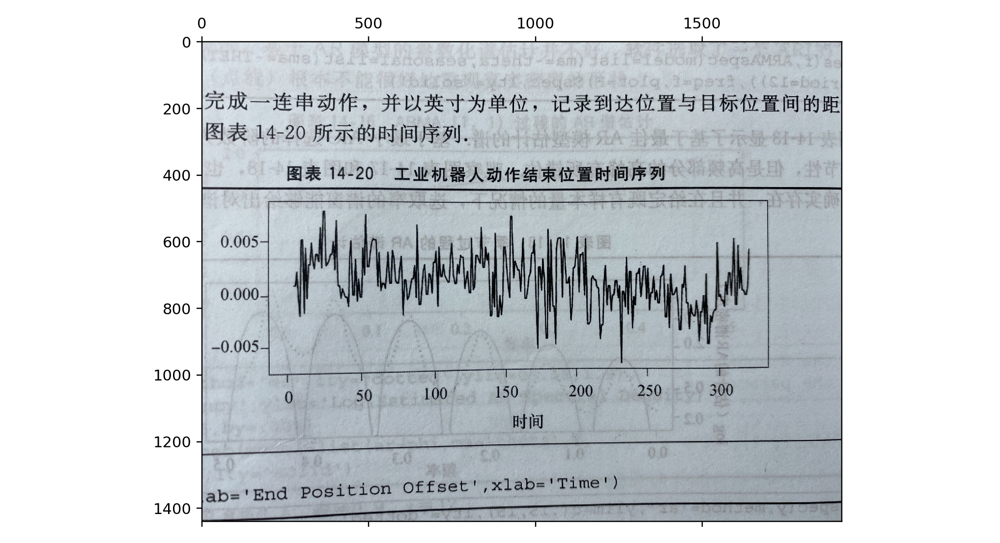

In [33]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.matshow(img)
fig.tight_layout()

# 第二步：投射变换

- 为什么需要投影变换？
- 因为有的时候拍照的时候，并不是正对照片的，会造成照片一定的扭曲。因此需要投射变换

## 注意事项：
- width：这个参数指的是投射变换后的图像的宽度，这个参数一般来说不设置也行，设置也可以，
- height：这个参数指的是投射变换后的图像的高度， 这个参数一般来说设置不设置都可以，
- margin：这个图像是设置图标的边缘宽度， 这个参数不建议设置太大或者太小，一般0-100左右，看参考你的刻度和面板框的具体像素距离。** 主要是为了你在投射变换后，可以看到真实的刻度 **
- part 2 里面的4个成对数据分别是你的图像里面的面板的边框的左上、右上、左下、右下的位置（x,y）坐标。

- 别的就不需要设置了！

<IPython.core.display.Javascript object>


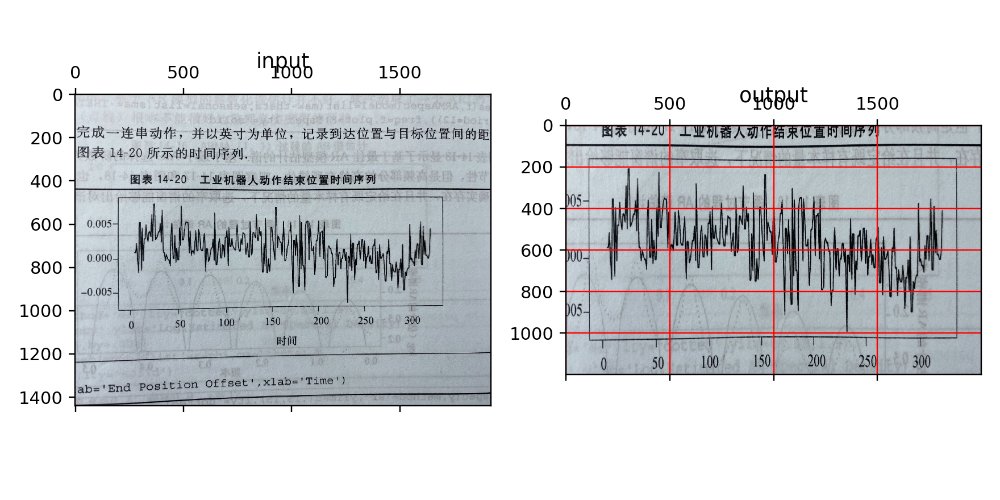

In [5]:
# part 1
width = 2000
height = 1200
# upleft, upright, bottomleft, bottomright
margin = 100

# part 2
pts1 = np.float32([[203.548-margin, 483.029-margin], # 左上
                   [1696.7+margin,483.029-margin],   # 右上
                   [201.548-margin,999.761+margin],  # 左下
                   [1696.7+margin,978.281+margin]])  # 右下
# part 3
pts2 = np.float32([[0,0], [width,0], [0, height], [width, height]])

# part 4
M = cv2.getPerspectiveTransform(pts1,pts2)
dst = cv2.warpPerspective(img,M,(width, height))
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(8,4))

ax1.matshow(img)
ax1.set_title("input")

ax2.matshow(dst)
ax2.set_title("output")
ax2.grid(color='red')
fig.tight_layout()

# 第三步：观察右边的直方图

## 注意事项

- 左一图是原图
- 中间的图是灰度图：主要是将图片的rgb三个值取加权平均数。
- 重点是右一的直方图：可以在图片的下方的toolbar选取缩放按钮，然后在图像上放缩，可以看到；当然从整体上来说，数量最多的基本上是背景的像素，线的像素数量一般都很少，像素的值很低，可以看到，大部分数据都是在150以上非常多，在0附近比较多，在100左右是最少的，当然不同的图像的直方图并不一样，之所以介绍这个直方图，是为了给下面的筛选像素做铺垫，只有大概掌握直方图，才能正确筛选出你想要的线。

<IPython.core.display.Javascript object>


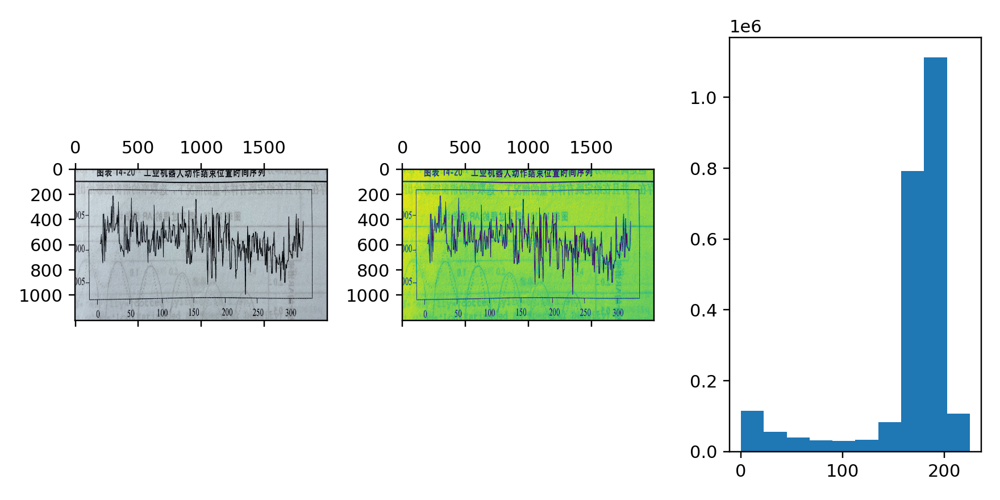

In [6]:
rgb_weights = [0.2989, 0.5870, 0.1140]
dstgray = np.dot(dst, rgb_weights)
fig, (ax0,ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(8,4))
_ = ax0.matshow(dst)
_ = ax1.matshow(dstgray)
_ = ax2.hist(dstgray.reshape(-1, 1).squeeze())
fig.tight_layout()

# 第四步：筛选像素

## 注意事项：
- 正常来说，一个图大部分像素都是背景，很少的像素是线或者坐标轴， 根据上面的第三步的直方图可以看到，大部分值都是在100以内，而且0附近也较多，因此你可以设置像素的范围，也就是调整下面两个参数：
- pixellow: 这个调整像素的最低值的阀门，最好在[0~100]内
- pixelup：这个是调整像素的最高值的阀门， 最好在[30~150]内
- 上面两个参数的要求都是一个大概的范围，但是必须满足范围：0 <= piexllow < pixelup <= 255.

## 调整像素范围的小技巧：
- 我一般都会在使用默认值，然后结合直方图、并且观察展示出来的效果，不断的放大，查看那些没有被覆盖的像素，然后调整具体的范围

<IPython.core.display.Javascript object>


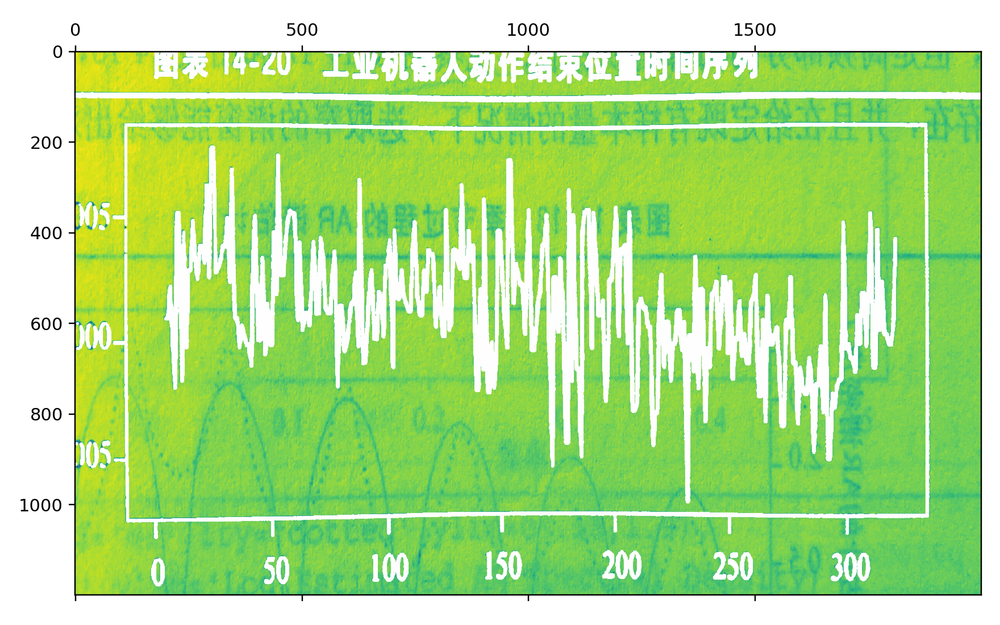

In [10]:
# part 1
pixellow = 0
pixelup = 60

# part 2
detectxy = np.array([])
value = dstgray

allx = []
ally = []
for i in range(value.shape[0]):
    for j in range(value.shape[1]):
        if pixellow < value[i, j] < pixelup:
            ally.append(i)
            allx.append(j)
fig, ax = plt.subplots(figsize=(8, 5))

ax.matshow(dstgray)
ax.scatter(allx, np.array(ally), s = 0.5, c='white', alpha=0.9) # dstgray.shape[0] -
fig.tight_layout()
global detectxy
detectxy = np.concatenate((np.array(allx).reshape(-1,1),
                          np.array(ally).reshape(-1,1)), axis=1)
detectxy[:, 1] = dstgray.shape[0] - detectxy[:, 1]

# 第五步：进一步筛选数据

## 上图介绍：
- 上图的白点主要是经过像素筛选后的像素（虽然看起来是白线，但是本质都是由无数个白点组成）
- 但是我们想要的只是折线部分

## 下图介绍：
- 下面可以看到代码中有matplotlib的widgets部分，这个部分就是需要操作鼠标将你需要的线圈出来。先运行一下代码，然后鼠标放在上面点击左键然后不放手，绕着你需要的数据走一圈，最好是闭合的曲线。

<IPython.core.display.Javascript object>


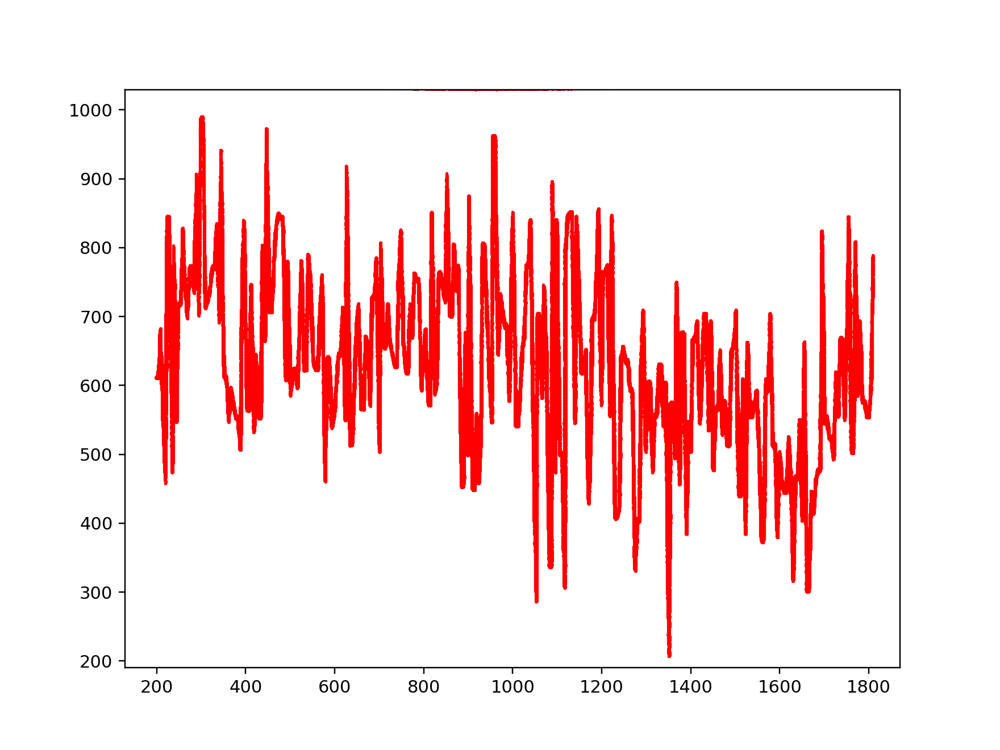

In [12]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(detectxy[:, 0], detectxy[:, 1], color='red',s=0.5)
from matplotlib.widgets import LassoSelector


locationxy = np.array([[0,0]])
def onselect(x):
    global locationxy
    if np.array(x).shape[0] > 1:
        locationxy = np.concatenate((locationxy, np.array(x)), axis=0)
    print(np.array(x).shape)
locationxy = np.delete(locationxy, 0, axis=0)

lineprops = {'color': 'green', 'linewidth': 4, 'alpha': 0.8}
lasso = LassoSelector(ax=ax, onselect=onselect, lineprops=lineprops)

# 第六步：自动判断点的类别
- 上面代码走一圈后，再运行下面的代码，基本上就快大功告成了

<IPython.core.display.Javascript object>


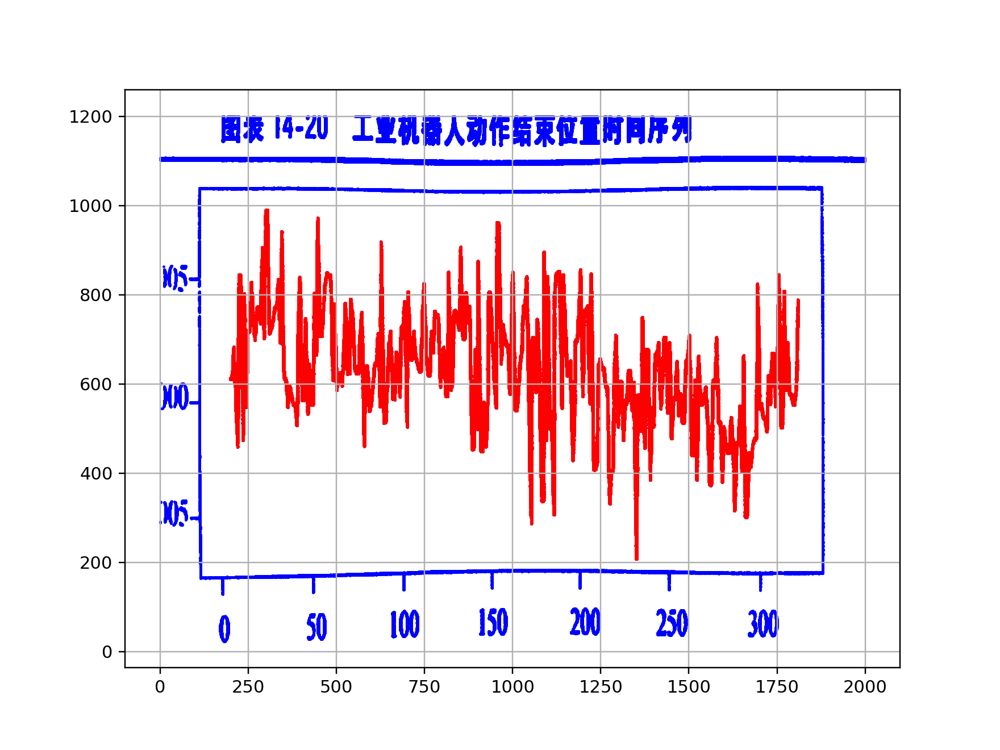

In [14]:
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

polygon = Polygon(locationxy)
detectxyin = [polygon.contains(Point(detectxy[i, 0], detectxy[i, 1])) for i in range(detectxy.shape[0])]
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(detectxy[:, 0], detectxy[:, 1], c='blue', s=0.3)
ax.scatter(detectxy[detectxyin, 0], detectxy[detectxyin, 1], c='red', s=0.3)
ax.grid()

from matplotlib.widgets import Cursor
cursor = Cursor(ax, useblit=False, color='green', linewidth=2)


np.set_printoptions(precision=6)

## 注意事项：
- 这里主要就是计算，提取上面线的最上面和最下面的两条线，为什么要这样的做：因为由于线的粗细的问题，导致没办法确定真实的数据点的具体数值（我目前还没想好怎么做）。所以我将所有所有点的上界和下届都提取出来，丢弃了每个像素点的值。
- 下图的蓝线是最大值，绿线是最小值，红点是像素值（放大即可看到）

<IPython.core.display.Javascript object>


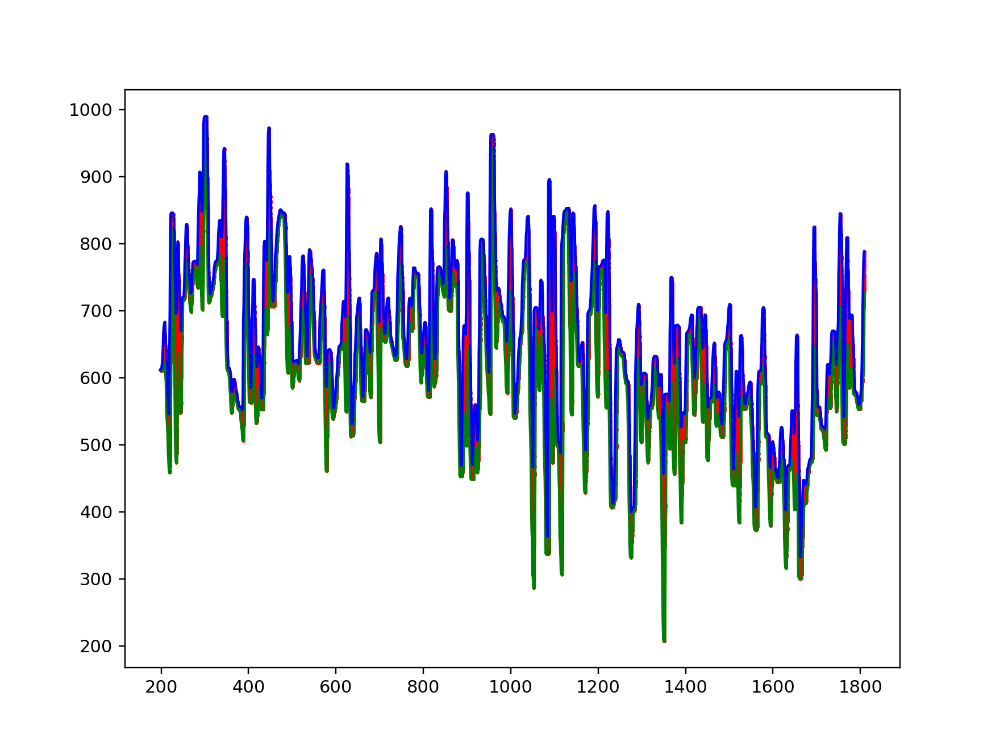

In [21]:
# calculate
realdata = detectxy[detectxyin, :]
miny = []
maxy = []

for i in np.unique(realdata[:,0]):
    temp = realdata[realdata[:, 0] == i, 1]
    tempminy = temp.min()
    tempmaxy = temp.max()
    miny.append(tempminy)
    maxy.append(tempmaxy)

miny = np.array(miny)
maxy = np.array(maxy)


# plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(np.unique(realdata[:,0]), miny, linestyle='-',c='green')
ax.plot(np.unique(realdata[:,0]), maxy, linestyle='-', c='blue')
ax.scatter(realdata[:, 0], realdata[:, 1], c='red', s=0.3)

# 第七步：获得数据

## 注意事项：
- outerdata有三列，第一列（索引为0）是x值；看代码可以知道117.62是真实x轴最小值0对应的x轴上的像素坐标，1705是真实x轴刻度300对应的像素坐标
- outerdata第二列（索引为1）是y的最小值， 557是真实y轴0所在的像素坐标y的值。835是真实y轴0.005对应的像素坐标y的值。
- outerdata第三列（索引为2）是y的最大值， 和y的最小值处理方法一样的

In [24]:
outerdata = np.concatenate((np.unique(realdata[:,0]).reshape(-1,1), miny.reshape(-1,1), maxy.reshape(-1,1)), axis=1).astype('float64')
outerdata[:, 0] = (outerdata[:, 0] - 117.62) / (1705 - 117.62) * (300-0)

for i in [1,2]:
    outerdata[:, i] = (outerdata[:, i] - 557) / (835-557) * (0.005 - 0)
outerdata = outerdata.astype('float64')

<IPython.core.display.Javascript object>


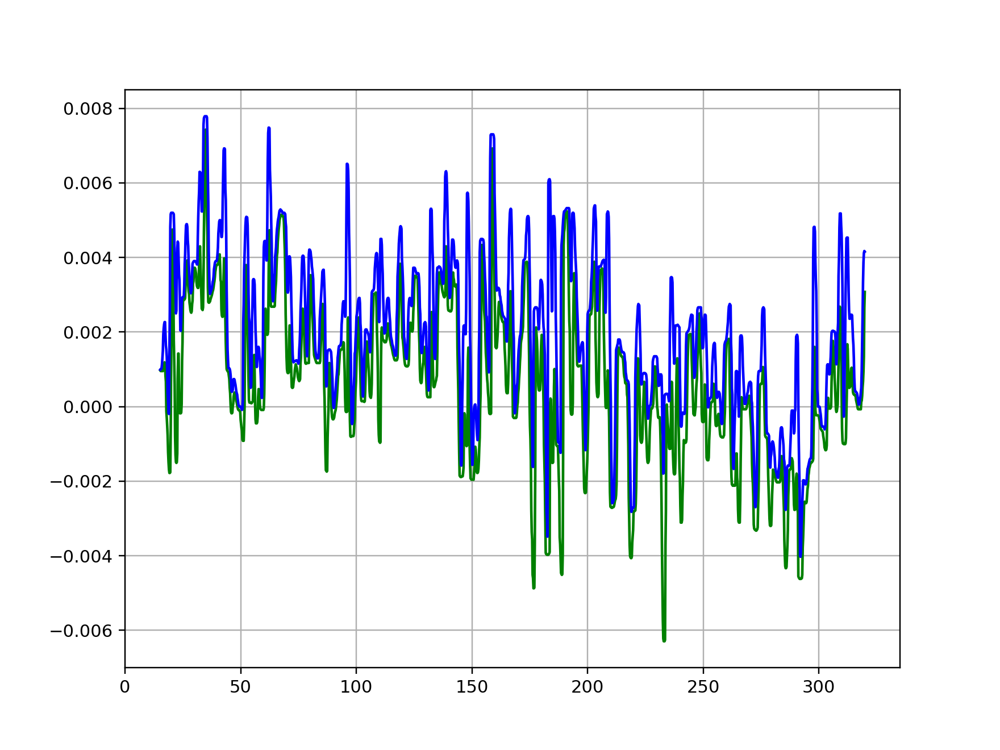

In [23]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(outerdata[:, 0], outerdata[:, 1], linestyle='-',c='green')
ax.plot(outerdata[:, 0], outerdata[:, 2], linestyle='-', c='blue')
ax.grid()

In [32]:
# 保存数据
np.set_printoptions(suppress=True)
np.set_printoptions(precision=5)   #设精度

np.savetxt("finaldata.txt", outerdata, fmt='%.5f')